In [41]:
import ollama
import numpy as np
import time
import matplotlib.pyplot as plt
from PIL import Image
import os
import pandas as pd

In [26]:

models = [model.model for model in ollama.list().models]

if len(models) == 0:
    print("Error: No models available.")
    exit()

selected_model = models[3]

print(f"Available models: {models}")
print(f"Using model: {selected_model}")

Available models: ['nomic-embed-text:latest', 'deepseek-r1:8b', 'llama3.2-vision:11b', 'llava:7b', 'deepseek-r1:1.5b']
Using model: llava:7b


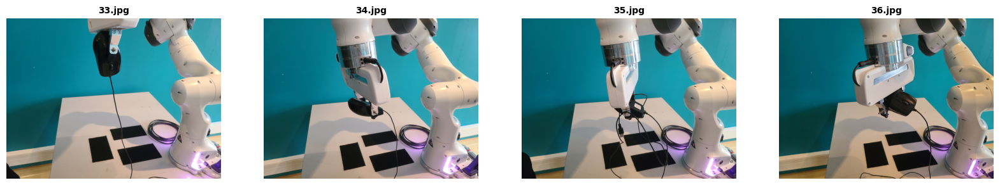

Prompt:
What is the object being held by the robotic arm in these 4 images?

llava:7b response:
 The image shows a robotic arm holding a small black and white checkered pattern. It appears to be demonstrating the precision or functionality of the robotic arm in handling delicate objects. The setup seems to be for showcasing the robot's abilities, possibly in a manufacturing or lab environment. 




In [30]:
images = [f"images/{33+i}.jpg" for i in range(4)]
images
fig, axes = plt.subplots(1, len(images), figsize=(20, 20//len(images)))
for ax, image in zip(axes, images):
    img = Image.open(image)
    ax.imshow(img)
    ax.set_title(image.split('/')[-1], fontsize=10, fontweight='bold')
    ax.axis('off')
plt.show()

prompt = f"What is the object being held by the robotic arm in these {len(images)} images?"
print("Prompt:")
print(prompt)
print()

chatbot = ollama.chat(
            model=selected_model,
            messages=[{
                'role': 'user',
                'content': prompt,
                'images': images
            }],
            stream=True
        )

print(f"{selected_model} response:")
for chunk in chatbot:
    print(chunk['message']['content'], end='', flush=True)
print("\n\n")

In [31]:

models = [model.model for model in ollama.list().models]

if len(models) == 0:
    print("Error: No models available.")
    exit()

selected_model = models[2]

print(f"Available models: {models}")
print(f"Using model: {selected_model}")

Available models: ['nomic-embed-text:latest', 'deepseek-r1:8b', 'llama3.2-vision:11b', 'llava:7b', 'deepseek-r1:1.5b']
Using model: llama3.2-vision:11b


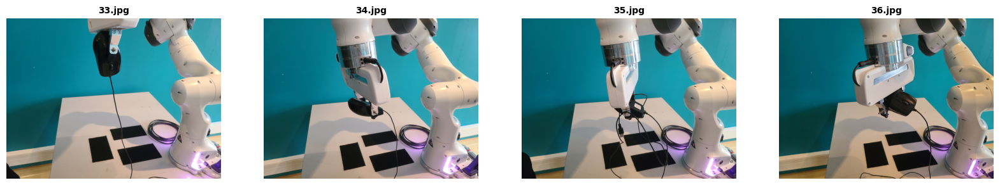

Prompt:
I will send you 4 images of a robotic arm holding an item, i want you to guess what the item is after seeing the 4 images, taking all of them into account, i want you to respond to my first 3 prompts with "Image (prompt number) received", then to the fourth prompt with "My final guess for the item being held by the robotic hand in these 4 images is: (guess)". Here is the first image:
llama3.2-vision:11b response:
My final guess for the item being held by the robotic hand in these 4 images is: a camera.





In [37]:
starting_image_id = 33
images = [f"images/{starting_image_id+i}.jpg" for i in range(4)]
fig, axes = plt.subplots(1, len(images), figsize=(20, 20//len(images)))
for ax, image in zip(axes, images):
    img = Image.open(image)
    ax.imshow(img)
    ax.set_title(image.split('/')[-1], fontsize=10, fontweight='bold')
    ax.axis('off')
plt.show()

prompt = f'I will send you 4 images of a robotic arm holding an item, i want you to guess what the item is after seeing the 4 images, taking all of them into account, i want you to respond to my first 3 prompts with "Image (prompt number) received", then to the fourth prompt with "My final guess for the item being held by the robotic hand in these 4 images is: (guess)". Here is the first image:'
print("Prompt:")
print(prompt)

chatbot = ollama.chat(
        model=selected_model,
        messages=[{
                'role': 'user',
                'content': prompt,
                'images': [images[0]]
            }, 
            {
                'role': 'assistant',
                'content': 'Image 1 received'
            },
            {
                'role': 'user',
                'content': f'Second image',
                'images': [images[1]]
            },
            {
                'role': 'assistant',
                'content': 'Image 2 received'
            },
            {
                'role': 'user',
                'content': f'Third image',
                'images': [images[2]]
            },
            {
                'role': 'assistant',
                'content': 'Image 3 received'
            },
            {
                'role': 'user',
                'content': f'Fourth image, now guess what the item is',
                'images': [images[3]]
            }],
    )

print(f"{selected_model} response:")
print(chatbot['message']['content'])
print("\n\n")

In [43]:
def read_csv(file_path):
    if os.path.exists(file_path):
        df = pd.read_csv(file_path)
        return df
    else:
        print(f"File {file_path} does not exist.")
        return None
    
responses = read_csv("output/responses_with_final_success.csv")
responses.head(2)

,prompt,model,image_folder,image_name,model_response,correct_object_names,success,response_time,model_response_embedding,correct_object_embeddings,difference,angular_difference,final_success
0,What is the object in the image? Answer with a...,llava,images_base,01.jpg,Robot,mug; cup,False,1.892505,[-1.52445575e-02 4.37117850e-02 -1.31465080e-...,"[array([-5.19554900e-02, 6.49178250e-02, -1.5...",1.059456,0.561223,False
1,What is the object in the image? Answer with a...,llava,images_base,02.jpg,Robot,mug; cup,False,0.460591,[-1.52445575e-02 4.37117850e-02 -1.31465080e-...,"[array([-5.19554900e-02, 6.49178250e-02, -1.5...",1.059456,0.561223,False


In [47]:
llama3_2_responses = responses[responses['model'] == 'llama3.2-vision']
llama3_2_responses["correct_object_names"].unique()

array(['mug; cup', 'sponge', 'gloves; glove', 'plate; dish; tray', 'fan',
       'soap bottle; bottle of soap; cleaning solution; hand sanitizer',
       'controller', 'cloth; fabric; clothing', 'mouse', 'screwdriver',
       'pcb; circuit board; pcie', 'cleaning foam; cleaning solution'],
      dtype=object)

In [ ]:
def four_photos_guesser(
                        starting_image_id = 1, 
                        model_name="llama3.2-vision:11b", 
                        prompt= f'I will send you 4 images of a robotic arm holding an item, i want you to guess what the item is after seeing the 4 images, taking all of them into account, i want you to respond to my first 3 prompts with "Image (prompt number) received", then to the fourth prompt with just the name of the object, one or two words. Here is the first image:'
                    ):
    starting_image_id = 4 * starting_image_id - 3
    images = [f"images/{starting_image_id+i:02d}.jpg" for i in range(4)]
    chatbot = ollama.chat(
            model=model_name,
            messages=[{
                    'role': 'user',
                    'content': prompt,
                    'images': [images[0]]
                }, 
                {
                    'role': 'assistant',
                    'content': 'Image 1 received'
                },
                {
                    'role': 'user',
                    'content': f'Second image',
                    'images': [images[1]]
                },
                {
                    'role': 'assistant',
                    'content': 'Image 2 received'
                },
                {
                    'role': 'user',
                    'content': f'Third image',
                    'images': [images[2]]
                },
                {
                    'role': 'assistant',
                    'content': 'Image 3 received'
                },
                {
                    'role': 'user',
                    'content': f'Fourth image, now guess what the item is',
                    'images': [images[3]]
                }],
        )
    return chatbot['message']['content']

def one_photo_guesser(
                        image_id = 1,
                        model_name="llama3.2-vision:11b",
                        prompt= f'What is the object being held by the robotic arm in this image? Respond with just the name of the object, one or two words."'
                    ):
    image = f"images/{image_id:02d}.jpg"
    chatbot = ollama.chat(
            model=model_name,
            messages=[{
                    'role': 'user',
                    'content': prompt,
                    'images': [image]
                }],
        )
    return chatbot['message']['content']

In [102]:
one_photo_guesser(33)

'Mouse.'

Image ID: 2
Image path: images/05.jpg
Model: llama3.2-vision:11b
Prompt: I will send you 4 images of a robotic arm holding an item, i want you to guess what the item is after seeing the 4 images, taking all of them into account, i want you to respond to my first 3 prompts with "Image (prompt number) received", then to the fourth prompt with "My final guess for the item being held by the robotic hand in these 4 images is: (guess)". Here is the first image:


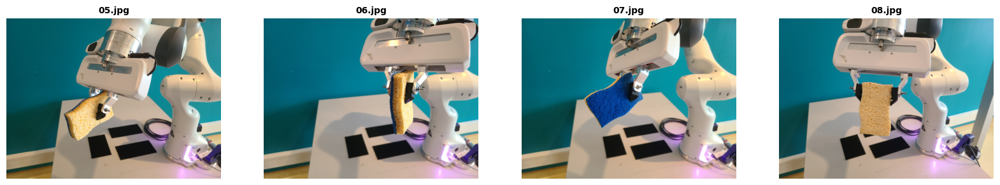

Correct object name: sponge
llama3.2-vision guessses per image:
Image 1: Sponge.
Image 2: Sponge.
Image 3: Sponge.
Image 4: Sponge.
llama3.2-vision guessses for all 4 images:
All 4 Images: My final guess for the item being held by the robotic hand in these 4 images is: Sponge.


In [105]:
image_id = 2
print(f"Image ID: {image_id}")
image_path_id = 4 * image_id - 3
print(f"Image path: images/{4*image_id - 3:02d}.jpg")
print(f"Model: llama3.2-vision:11b")
print(f"Prompt: {prompt}")

images = [f"images/{image_path_id+i:02d}.jpg" for i in range(4)]
fig, axes = plt.subplots(1, len(images), figsize=(20, 20//len(images)))
for ax, image in zip(axes, images):
    img = Image.open(image)
    ax.imshow(img)
    ax.set_title(image.split('/')[-1], fontsize=10, fontweight='bold')
    ax.axis('off')
plt.show()

correct_object_name = responses[responses["image_name"] == str(image_path_id).zfill(2) + ".jpg"]["correct_object_names"].unique()[0]
print(f"Correct object name: {correct_object_name}")
print(f"llama3.2-vision guessses per image:")
print(f"Image 1: {one_photo_guesser(image_path_id)}")
print(f"Image 2: {one_photo_guesser(image_path_id+1)}")
print(f"Image 3: {one_photo_guesser(image_path_id+2)}")
print(f"Image 4: {one_photo_guesser(image_path_id+3)}")

print(f"llama3.2-vision guessses for all 4 images:")
print(f"All 4 Images: {four_photos_guesser(image_id)}")


In [158]:
def analyze_object_guesses(image_id):
    image_path_id = 4 * image_id - 3
    print(f"Image ID: {image_id} / 12")
    
    images = [f"images/{image_path_id+i:02d}.jpg" for i in range(4)]
    
    correct_object_name = responses[responses["image_name"] == f"{image_path_id:02d}.jpg"]["correct_object_names"].unique()[0]
    print(f"Correct object name: {correct_object_name}")
    
    fig, axes = plt.subplots(2, 4, figsize=(20, 10), gridspec_kw={'height_ratios': [3, 1]})
    
    for i, (ax, image_path) in enumerate(zip(axes[0], images)):
        img = Image.open(image_path)
        ax.imshow(img)
        ax.set_title(image_path.split('/')[-1], fontsize=16, fontweight='bold')
        ax.axis('off')
    
    plt.figtext(0.5, 0.35, "Guesses based on one image (each image individually):", ha='center', fontsize=20, fontweight='bold')
    
    individual_guesses = []
    for i in range(4):
        guess = one_photo_guesser(image_path_id+i)
        individual_guesses.append(guess)
        
        is_correct = any(opt.lower().strip() in guess.lower() or guess.lower() in opt.lower().strip() 
                         for opt in correct_object_name.split(';'))
        color = 'green' if is_correct else 'red'
        
        axes[1, i].text(0.5, 1, guess, ha='center', va='center', fontsize=16, color=color)
        axes[1, i].axis('off')
    
    overall_guess = four_photos_guesser(image_id)
    
    is_overall_correct = any(opt.lower().strip() in overall_guess.lower() or overall_guess.lower() in opt.lower().strip() 
                            for opt in correct_object_name.split(';'))
    overall_color = 'green' if is_overall_correct else 'red'
    
    plt.figtext(0.5, 0.2, "Guess based on all four images:", ha='center', fontsize=20, fontweight='bold')
    plt.figtext(0.5, 0.15, f"{overall_guess.split(': ')[-1]}", ha='center', fontsize=16, color=overall_color)

    plt.figtext(0.5, 0.05, "Model: llama3.2-vision:11b", ha='center', fontsize=16, fontweight='bold')
    
    plt.tight_layout()
    plt.suptitle(f"{correct_object_name}", fontsize=35, fontweight='bold', y=0.85)
    plt.show()
    
    #print(f"llama3.2-vision guesses per image:")
    #for i, guess in enumerate(individual_guesses):
    #    print(f"Image {i+1}: {guess}")
    #print(f"llama3.2-vision guess for all 4 images:")
    #print(f"All 4 Images: {overall_guess}")
    
    return individual_guesses + [overall_guess]


Image ID: 2 / 12
Correct object name: sponge


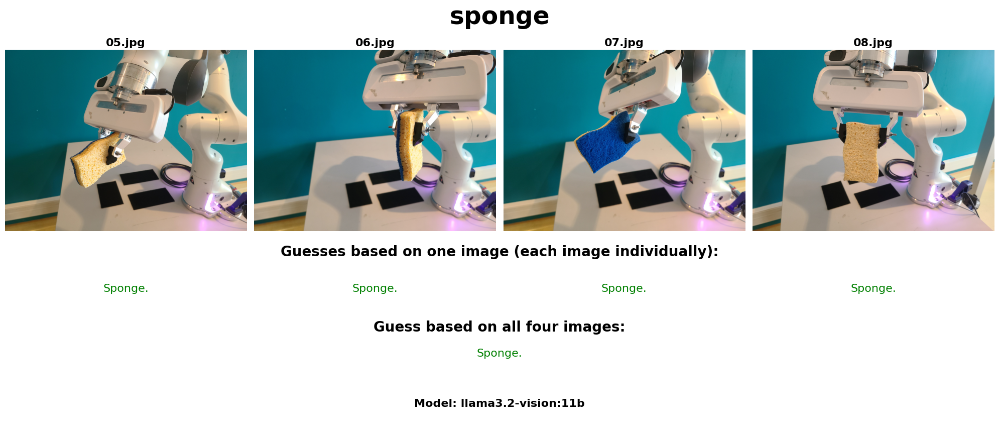

llama3.2-vision guesses per image:
Image 1: Sponge.
Image 2: Sponge.
Image 3: Sponge.
Image 4: Sponge.
llama3.2-vision guess for all 4 images:
All 4 Images: My final guess for the item being held by the robotic hand in these 4 images is: Sponge.


['Sponge.',
 'Sponge.',
 'Sponge.',
 'Sponge.',
 'My final guess for the item being held by the robotic hand in these 4 images is: Sponge.']

In [157]:
analyze_object_guesses(2)

---

Image ID: 1 / 12
Correct object name: mug; cup


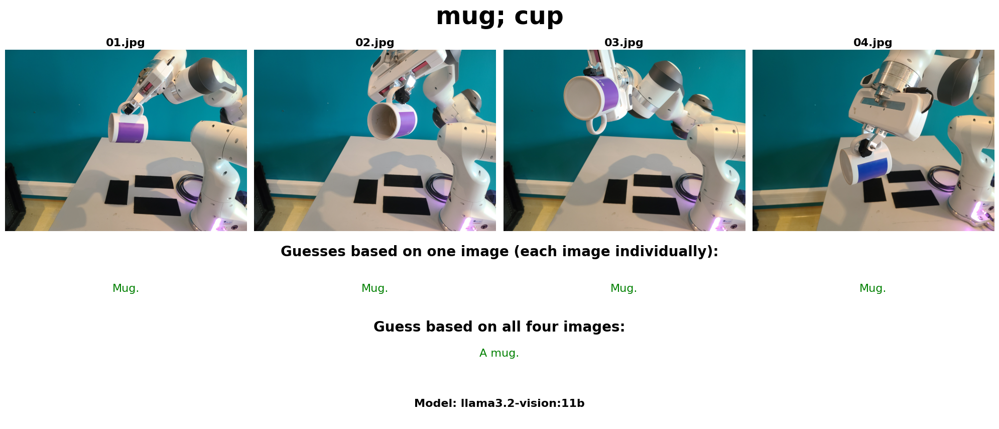

Image ID: 2 / 12
Correct object name: sponge


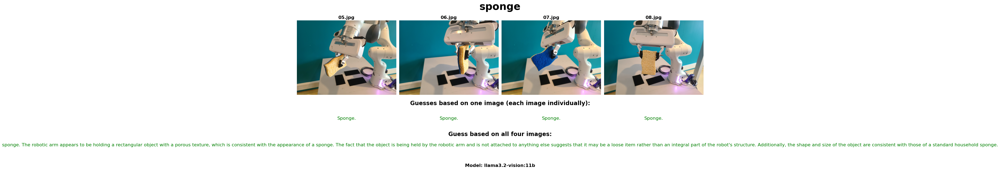

Image ID: 3 / 12
Correct object name: gloves; glove


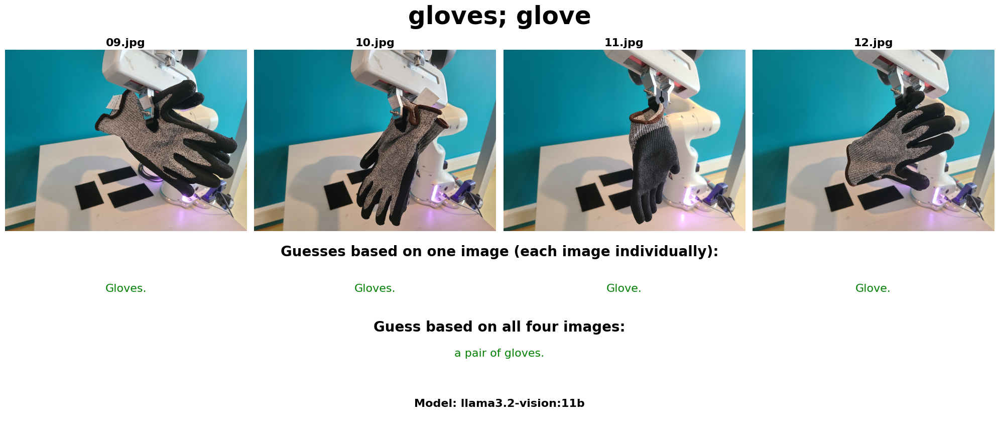

Image ID: 4 / 12
Correct object name: plate; dish; tray


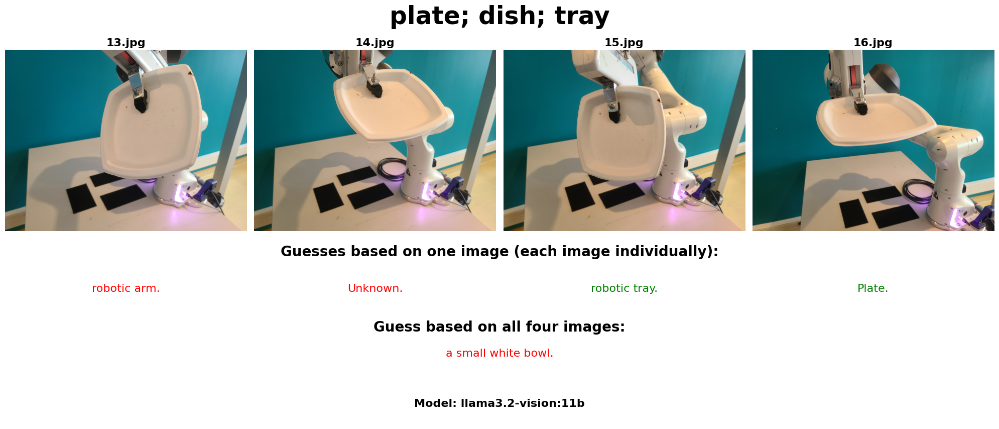

Image ID: 5 / 12
Correct object name: fan


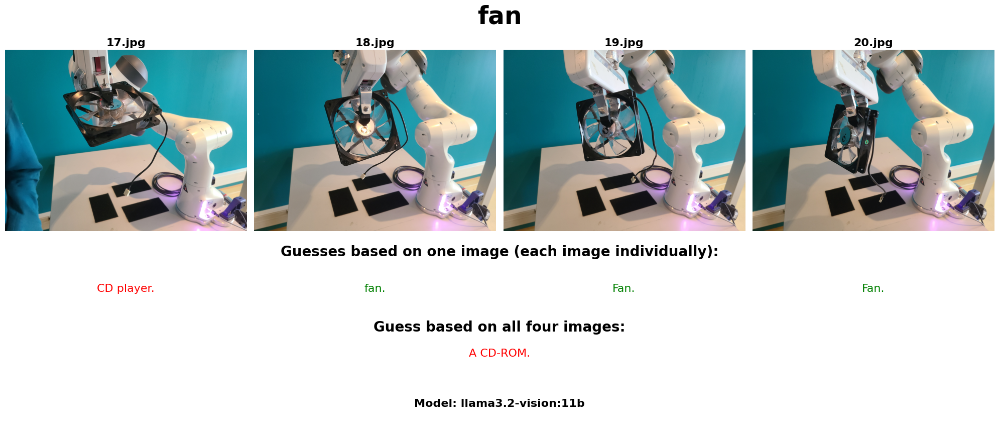

Image ID: 6 / 12
Correct object name: soap bottle; bottle of soap; cleaning solution; hand sanitizer


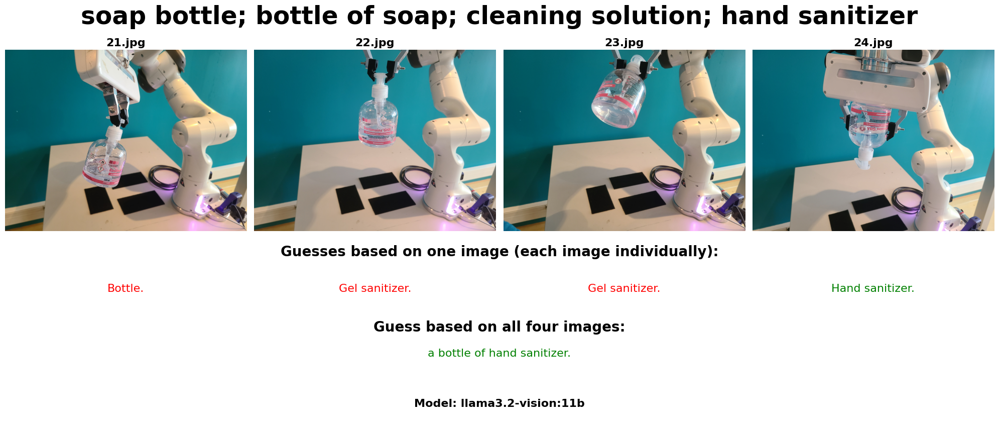

Image ID: 7 / 12
Correct object name: controller


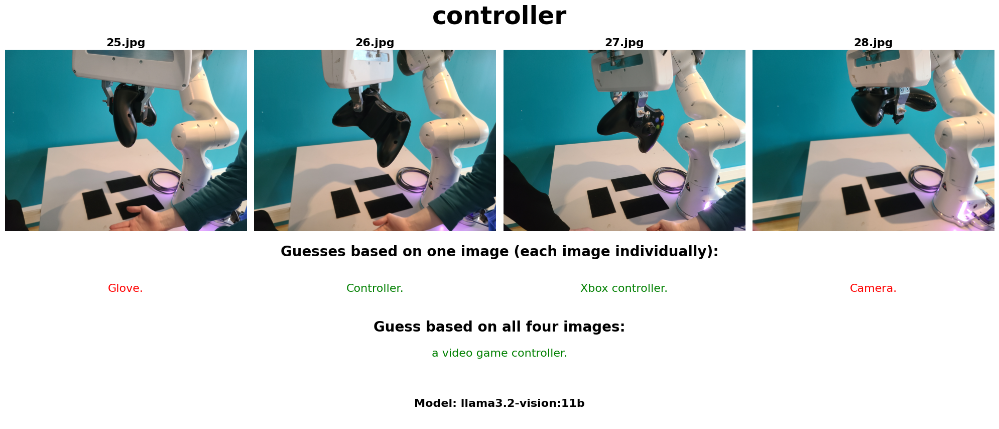

Image ID: 8 / 12
Correct object name: cloth; fabric; clothing


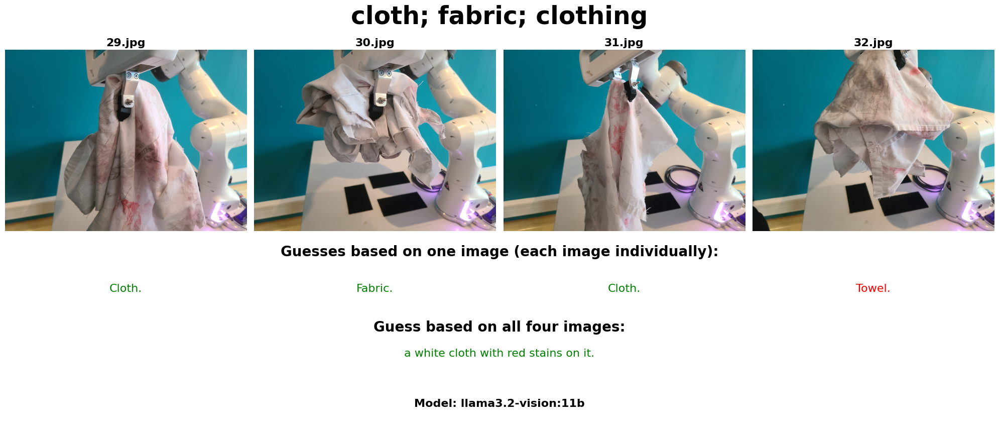

Image ID: 9 / 12
Correct object name: mouse


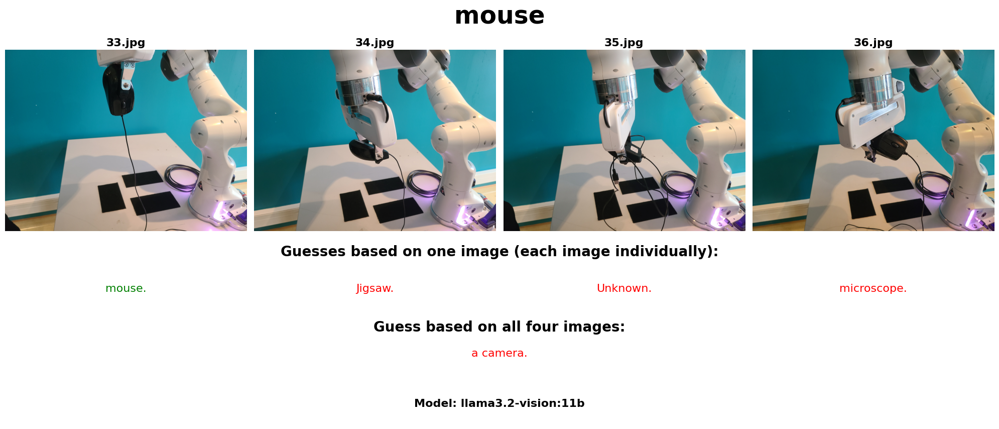

Image ID: 10 / 12
Correct object name: screwdriver


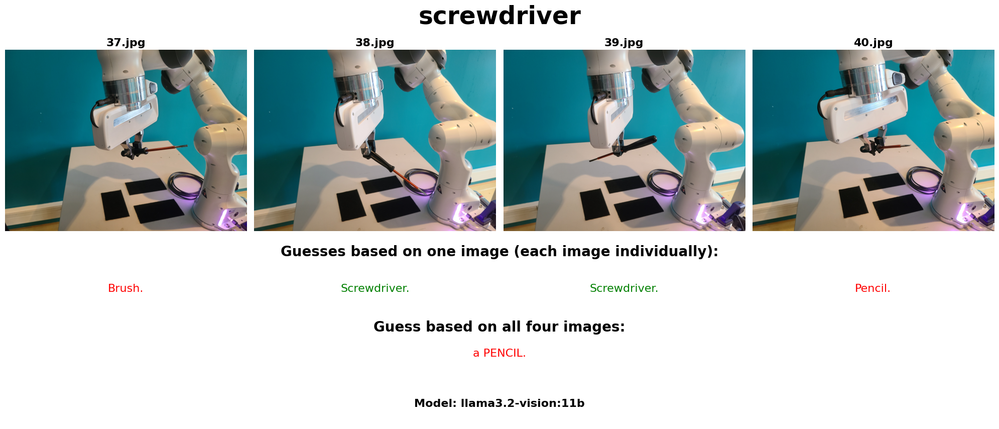

Image ID: 11 / 12
Correct object name: pcb; circuit board; pcie


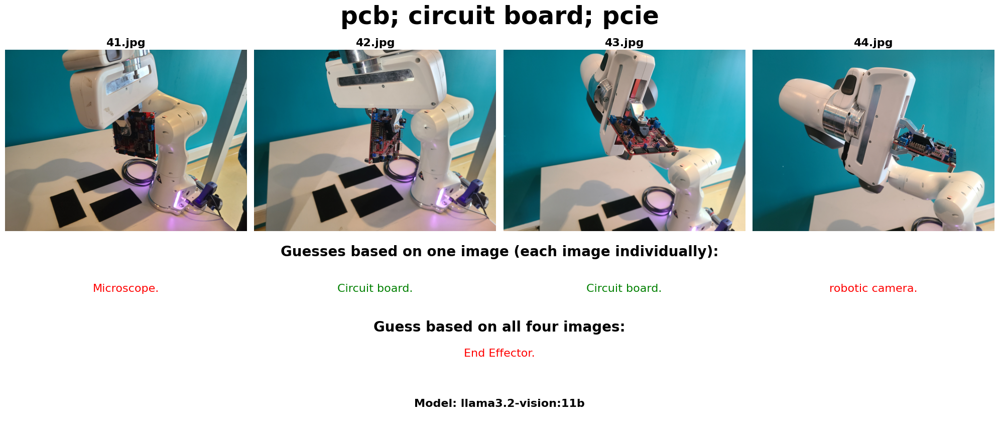

Image ID: 12 / 12
Correct object name: cleaning foam; cleaning solution


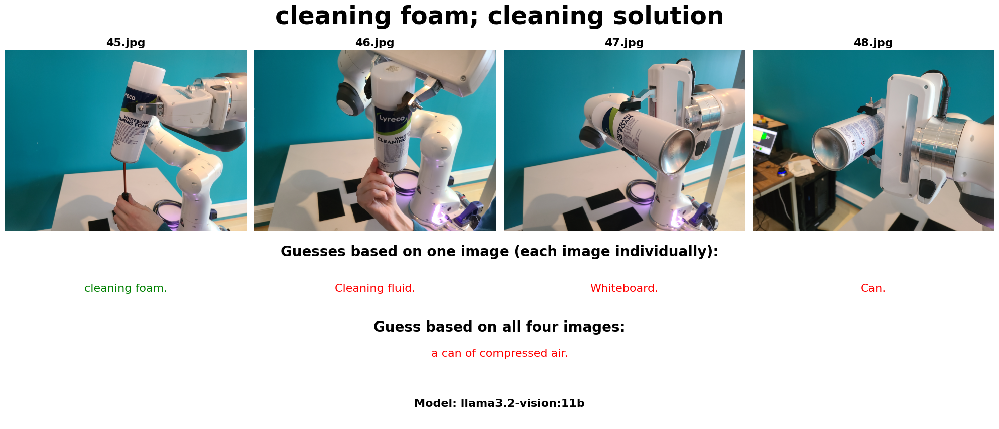

In [159]:
guesses = []
for i in range(1, 13):
    guesses.append(analyze_object_guesses(i))